## Imports and Global Dictionaries

In [1]:
from google.colab import drive
import os
import json
from collections import defaultdict
from IPython.display import Image
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
import matplotlib.colors as mcolors
import numpy as np
from tabulate import tabulate
import pandas as pd

# Define image categories
image_category = {
    "Rubin Vase": (("two faces", "vase"), ["rubin_vase_1.png", "rubin_vase_2.png", "rubin_vase_3.png"]),
    "Necker Cube": (("a cube seen from above", "a cube seen from below"), ["necker_cube_1.png", "necker_cube_2.png", "necker_lattice.png"]),
    "Duck-Rabbit": (("duck", "rabbit"), ["duck_rabbit_1.png", "duck_rabbit_2.png", "duck_rabbit_3.png"]),
    "Young-Old Woman": (("young woman", "old woman"), ["young_old_woman_1.jpeg", "young_old_woman_2.jpeg", "young_old_woman_3.jpeg"]),
    "Cat-Dog": (("cat", "dog"), ["cat_dog_1.png"]),
    "Grimace-Begger": (("face grimacing", "begger sticking out their hands"), ["grimace_begger_1.jpeg"]),
    "Idaho-Face": (("the state of Idaho", "face"),["idaho_face_1.png"]),
    "Lion-gorilla-Tree": (("lion and gorilla", "tree"), ["lion_gorilla_tree_1.jpeg"]),
    "Spinning Dancer": (("dancer spinning clockwise", "dancer spinning counter-clockwise"), ["spining_dancer_1.jpeg"]),
    "Woman-Trumpeter": (("woman's face", "saxophonist"), ["woman_trumpeter_1.jpeg"]),
    "Schroeder Stairs": (("upright stairs", "sideways stairs"), ["schroeder_stairs_1.png", "schroeder_stairs_2.png"]),
    "Raven Bear": (("bird", "bear"), ["raven-bear_1.png"]),
    "Takashima": (("two faces", "vase"), ["takashima_1.png", "takashima_2.png", "takashima_3.png", "takashima_4.png", "takashima_5.png", "takashima_6.png", "takashima_7.png", "takashima_8.png"])
}

# Define models
global_models = {"CLIP": "openai/clip-vit-base-patch32",
          "LLaVa": "llava-hf/llava-1.5-7b-hf",
          "IDEFICS": "HuggingFaceM4/idefics-9b",
          "MPLUG_OWL": "MAGAer13/mplug-owl-llama-7b",
          "InstructBLIP": "Salesforce/instructblip-flan-t5-xl",
          "BLIP-2": "Salesforce/blip2-opt-2.7b"
}

model_to_ids = {
    "openai/clip-vit-base-patch32":"CLIP-B/32",
    "openai/clip-vit-base-patch16":"CLIP-B/16",
    "laion/CLIP-ViT-B-32-laion2B-s34B-b79K":"CLIP-B/32-Laion",
    "HuggingFaceM4/idefics-9b":"Idefics-9b",
    "HuggingFaceM4/idefics-9b-instruct": "Idefics-9b-instruct",
    "llava-hf/llava-1.5-7b-hf":"LLaVA1.5-7b",
    "llava-hf/llava-1.5-13b-hf":"LLaVA1.5-13b",
    "MAGAer13/mplug-owl-llama-7b":"mPLUG-Owl",
    "Salesforce/instructblip-flan-t5-xl":"InstrBLIP-Flan-T5-XL",
    "Salesforce/blip2-opt-2.7b":"BLIP2-OPT2.7b",
    "Salesforce/blip2-opt-6.7b":"BLIP2-OPT6.7b",
    "Salesforce/blip2-flan-t5-xl":"BLIP2-Flan-T5-XL",
  }



## Extract Original Image Data


In [2]:
# Mount Google Drive
drive.mount('/content/drive')

path = "/content/drive/My Drive/independent_thesis/results"
files = os.listdir(path)

# Filter the files to only include JSON files that start with "original_images"
json_files = [file for file in files if file.startswith("original_images") and not file.startswith("original_images_generation") and file.endswith(".json")]

# Load the JSON files into a list
data = []
for file in json_files:
    with open(os.path.join(path, file), "r") as f:
        data.append(json.load(f))

Mounted at /content/drive


## Each image averaged across all models
For each image, what is the probability distribution between the two interpretations, averaged across all models?

In [3]:
# Dictionary to store accumulated probabilities for each interpretation
interpretation_probabilities = defaultdict(lambda: defaultdict(list))

# Count of models
num_models = len(data)

# Iterate over each model's results
for model_result in data:
    # Extract model_id and outputs
    model_id = model_result['model_id']
    outputs = model_result['outputs']

    # Iterate over each image's interpretations and probabilities
    for image_name, interpretation_probs in outputs.items():
        # Iterate over each interpretation and its probability
        for interpretation, probability in interpretation_probs.items():
            # Accumulate probabilities
            interpretation_probabilities[image_name][interpretation].append(probability)

# # Calculate average probabilities
# for image_name, probabilities in interpretation_probabilities.items():
#     for interpretation in probabilities:
        # interpretation_probabilities[image_name][interpretation] /= num_models

# Displat results in table
table_data = []
for image_name, probabilities in interpretation_probabilities.items():
    for interpretation, probability in probabilities.items():
        table_data.append([image_name, interpretation, sum(probability)/len(probability)])

# Create the table
table = tabulate(table_data, headers=['Image', 'Interpretation', 'Average Probability'], tablefmt='grid')

# Print the table
print(table)

# # Print average probabilities
# for image_name, probabilities in interpretation_probabilities.items():
#     print(f"Image: {image_name}")
#     for interpretation, probability in probabilities.items():
#         print(f"Interpretation: {interpretation}, Average Probability: {probability}")
#     print()



+--------------------------+-----------------------------------+-----------------------+
| Image                    | Interpretation                    |   Average Probability |
+==========================+===================================+=======================+
| cat_dog_1.png            | cat                               |            0.652377   |
+--------------------------+-----------------------------------+-----------------------+
| cat_dog_1.png            | dog                               |            0.347623   |
+--------------------------+-----------------------------------+-----------------------+
| duck_rabbit_1.png        | duck                              |            0.591534   |
+--------------------------+-----------------------------------+-----------------------+
| duck_rabbit_1.png        | rabbit                            |            0.408466   |
+--------------------------+-----------------------------------+-----------------------+
| duck_rabbit_2.png  

## Replicating Takashima et al. 2012

VLMs diverge signifigantly from major findings in Takashima et al. 2012.

The main findings of Takashima et al.'s human study was a high preference for the faces interpretation for images 3, 4, and 7 and a high preference for the goblet interpretation for images 6 and 8.

No particular model replicated Takashima et al.'s results. This analysis shows minimal alignment between VLMs and humans on variations of the Rubin Vase bistable image.

## Each image category within and averaged across models

For each group of images (eg. Necker Cubes), what are the probability distribution averages both within a model and across models?

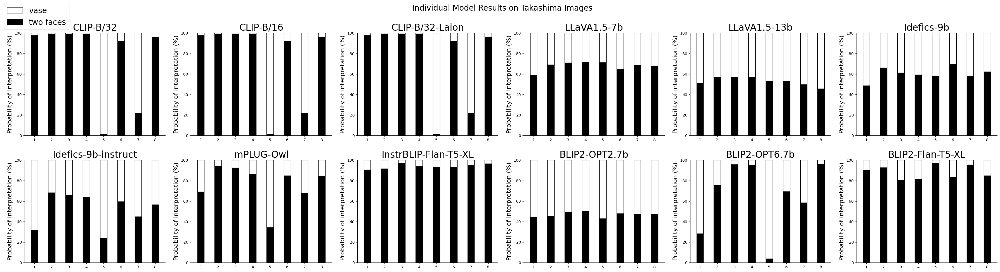

In [4]:
# Initialize figure for subplots
num_models = len(data)-1
fig, axes = plt.subplots(2, num_models//2, figsize=(num_models//2 * 6, 10))
offset = 0
axes = axes.flatten()
#set font size
plt.rcParams.update({'font.size': 20})
for idx, model_result in enumerate(data):
    # Extract model_id and outputs
    model_id = model_result['model_id']
    if model_id not in model_to_ids:
        offset = 1
        continue
    model_id = model_to_ids[model_id]
    outputs = model_result['outputs']
    idx = idx-offset
    # Dictionary to store accumulated probabilities for each interpretation
    interpretation_probabilities = defaultdict(lambda: defaultdict(float))

    # Iterate over each image's interpretations and probabilities
    for image_name, interpretation_probs in outputs.items():
        # Iterate over each interpretation and its probability
        for interpretation, probability in interpretation_probs.items():
            # Accumulate probabilities
            interpretation_probabilities[image_name][interpretation] += probability

    # Filter only Takashima images
    takashima_images = {image_name: probabilities for image_name, probabilities in interpretation_probabilities.items() if "takashima" in image_name}

    # Extract probabilities of "two faces" interpretation
    probabilities_two_faces = [probabilities["two faces"] * 100 for probabilities in takashima_images.values()]
    probabilities_vase = [100 - p1 for p1 in probabilities_two_faces]

    # Get the current axis
    ax = axes[idx]

    # Plot the bar chart for this model
    ax.bar(range(1, len(probabilities_two_faces) + 1), probabilities_two_faces, color='black', width=0.4, label='two faces', edgecolor='black')
    ax.bar(range(1, len(probabilities_two_faces) + 1), probabilities_vase, color='white', width=0.4, bottom=probabilities_two_faces, label='vase', edgecolor='black')

    ax.set_title(f"{model_id}")
    ax.set_ylabel("Probability of interpretation (%)", fontsize=16)
    ax.set_xticks(range(1, len(probabilities_two_faces) + 1))
    ax.set_ylim(0, 100)  # Set y-axis limits
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

handles = [plt.Rectangle((0, 0), 1, 1, fc=c, ec='black', lw=1) for c in ['white', 'black']]
fig.legend(loc='upper left', handles = handles,labels= ["vase", "two faces"])
fig.suptitle("Individual Model Results on Takashima Images", fontsize=20)
# Adjust layout and show the combined plot
plt.tight_layout()
plt.show()
fig.savefig(f"/content/takashima_individual_models.pdf")

In [5]:
# Dictionary to store accumulated probabilities for each interpretation within a model
interpretation_probabilities_within_model = defaultdict(lambda: defaultdict(list))

# Dictionary to store accumulated probabilities for each interpretation across models
interpretation_probabilities_across_models = defaultdict(list)

# Iterate over each model's results
for model_result in data:
    # Extract model_id and outputs
    model_id = model_result['model_id']
    outputs = model_result['outputs']

    # Iterate over each image's interpretations and probabilities
    for image_category_name, (interpretations, image_names) in image_category.items():
        # Get the image names for the current image category
        for image_name in image_names:
            interpretation_probs = outputs[image_name]
            # Iterate over each interpretation and its probability
            for interpretation, probability in interpretation_probs.items():
                # Accumulate probabilities within each model
                interpretation_probabilities_within_model[model_id][(image_category_name, interpretation)].append(probability)
                # Accumulate probabilities across models
                interpretation_probabilities_across_models[(image_category_name, interpretation)].append(probability)

# Convert lists to numpy arrays
for model_id, probabilities in interpretation_probabilities_within_model.items():
    for (image_category_name, interpretation), probs_list in probabilities.items():
        interpretation_probabilities_within_model[model_id][(image_category_name, interpretation)] = np.array(probs_list)

for key, probs_list in interpretation_probabilities_across_models.items():
    interpretation_probabilities_across_models[key] = np.array(probs_list)

# Print average probabilities within each model
print("Average probabilities within each model:")
for model_id, probabilities in interpretation_probabilities_within_model.items():
    print(f"Model ID: {model_id}")
    for (image_category_name, interpretation), probs_array in probabilities.items():
        avg_probability = np.mean(probs_array)
        print(f"Image Category: {image_category_name}, Interpretation: {interpretation}, Average Probability: {avg_probability}")
    print()

# Print average probabilities across all models
print("Average probabilities across all models:")
for (image_category_name, interpretation), probs_array in interpretation_probabilities_across_models.items():
    avg_probability = np.mean(probs_array)
    print(f"Image Category: {image_category_name}, Interpretation: {interpretation}, Average Probability: {avg_probability}")


Average probabilities within each model:
Model ID: MAGAer13/mplug-owl-llama-7b-ft
Image Category: Rubin Vase, Interpretation: vase, Average Probability: 0.10264125093817711
Image Category: Rubin Vase, Interpretation: two faces, Average Probability: 0.897358775138855
Image Category: Necker Cube, Interpretation: a cube seen from below, Average Probability: 0.3640541632970174
Image Category: Necker Cube, Interpretation: a cube seen from above, Average Probability: 0.6359458367029825
Image Category: Duck-Rabbit, Interpretation: duck, Average Probability: 0.5346983994046847
Image Category: Duck-Rabbit, Interpretation: rabbit, Average Probability: 0.46530161798000336
Image Category: Young-Old Woman, Interpretation: young woman, Average Probability: 0.5497026443481445
Image Category: Young-Old Woman, Interpretation: old woman, Average Probability: 0.450297345717748
Image Category: Cat-Dog, Interpretation: cat, Average Probability: 0.5544704794883728
Image Category: Cat-Dog, Interpretation: do

In [6]:
model_to_ids = {
    "openai/clip-vit-base-patch32":"CLIP-B/32",
    "openai/clip-vit-base-patch16":"CLIP-B/16",
    "laion/CLIP-ViT-B-32-laion2B-s34B-b79K":"CLIP-B/32-Laion",
    "HuggingFaceM4/idefics-9b":"Idefics-9b",
    "HuggingFaceM4/idefics-9b-instruct": "Idefics-9b-instruct",
    "llava-hf/llava-1.5-7b-hf":"LLaVA1.5-7b",
    "llava-hf/llava-1.5-13b-hf":"LLaVA1.5-13b",
    "MAGAer13/mplug-owl-llama-7b":"mPLUG-Owl",
    "Salesforce/instructblip-flan-t5-xl":"InstrBLIP-Flan-T5-XL",
    "Salesforce/blip2-opt-2.7b":"BLIP2-OPT2.7b",
    "Salesforce/blip2-opt-6.7b":"BLIP2-OPT6.7b",
    "Salesforce/blip2-flan-t5-xl":"BLIP2-Flan-T5-XL",
  }

import numpy as np

final_models_dict = {}
final_avg_dict = defaultdict(list)

for model_id, probabilities in interpretation_probabilities_within_model.items():
    for (image_category_name, interpretation), probability in probabilities.items():
      if interpretation == image_category[image_category_name][0][0]:
        final_models_dict[(model_id, image_category_name)] = interpretation_probabilities_within_model[model_id][(image_category_name, interpretation)]

grouped_probs = {}
model_names = model_to_ids.values()
for (model, image_category_name), probability in final_models_dict.items():
    if model not in model_to_ids:
        continue
    model = model_to_ids[model]
    if image_category_name not in grouped_probs:
        grouped_probs[image_category_name] = {}
    grouped_probs[image_category_name][model] = probability*100
    final_avg_dict[image_category_name].append(np.mean(probability)*100)


{'Rubin Vase': {'CLIP-B/32': array([0.99352056, 0.24350783, 0.39518386]), 'CLIP-B/16': array([0.99352056, 0.24350783, 0.39518386]), 'CLIP-B/32-Laion': array([0.99352056, 0.24350783, 0.39518386]), 'LLaVA1.5-7b': array([0.66476816, 0.41833904, 0.53677797]), 'LLaVA1.5-13b': array([0.53358781, 0.4499208 , 0.54199225]), 'Idefics-9b': array([0.71383077, 0.62245935, 0.684264  ]), 'Idefics-9b-instruct': array([0.53509843, 0.41300359, 0.51366848]), 'mPLUG-Owl': array([0.94909251, 0.72644204, 0.93918175]), 'InstrBLIP-Flan-T5-XL': array([0.99551421, 0.89625138, 0.95077789]), 'BLIP2-OPT2.7b': array([0.47852883, 0.4263216 , 0.48633155]), 'BLIP2-OPT6.7b': array([0.94966936, 0.20497774, 0.70171309]), 'BLIP2-Flan-T5-XL': array([0.86658478, 0.96377999, 0.90731227])}, 'Necker Cube': {'CLIP-B/32': array([0.80040848, 0.85436261, 0.49635464]), 'CLIP-B/16': array([0.80040848, 0.85436261, 0.49635464]), 'CLIP-B/32-Laion': array([0.80040848, 0.85436261, 0.49635464]), 'LLaVA1.5-7b': array([0.59893787, 0.5794004

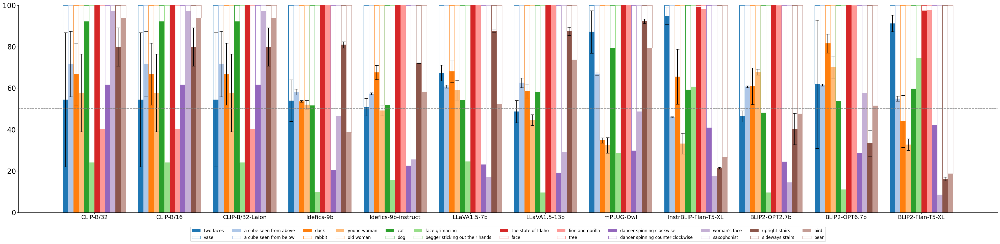

In [7]:
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams.update({'font.size': 20})

# Assuming final_models_dict, model_to_ids, and image_category are already defined

# Create grouped probabilities as before
grouped_probs = {}
model_names = list(model_to_ids.values())

for (model, image_category_name), probability in final_models_dict.items():
    if model not in model_to_ids:
        continue
    if image_category_name == 'Takashima': #or 'idaho' in image_category_name.lower():
        continue
    model = model_to_ids[model]
    if image_category_name not in grouped_probs:
        grouped_probs[image_category_name] = {}
    grouped_probs[image_category_name][model] = probability

print(grouped_probs)
# Prepare the colormap for different colors
cmap = plt.get_cmap("tab20")  # Colormap with 10 different colors

# Prepare the figure
fig, ax = plt.subplots(figsize=(40, 10))

# Initialize bar index for each model
bar_width = 0.07
bar_positions = np.arange(len(grouped_probs))
print(bar_positions)

# Loop through each model name and plot bars for each image category
for i, (image_category_name, probs) in enumerate(grouped_probs.items()):
    if image_category_name == 'Takashima': #or 'idaho' in image_category_name.lower():
        continue

    # Extract probabilities
    probabilities = np.array(list(probs.values()))
    primary_interpretation = image_category[image_category_name][0][0]
    secondary_interpretation = image_category[image_category_name][0][1]

    # Calculate probabilities and standard deviations
    primary_probs = probabilities.mean(axis=1) * 100
    primary_std = probabilities.std(axis=1) * 100
    secondary_probs = [100 - p1 for p1 in primary_probs]

    print(primary_probs)

    # Plot bars for this image category
    color = cmap(i % 20)  # Use a different color for each bar
    print(primary_probs)
    bar1 = ax.bar(bar_positions + ((i) * bar_width), primary_probs, width=bar_width, label=primary_interpretation, color=color)
    ax.bar(bar_positions + ((i) * bar_width), secondary_probs, width=bar_width, bottom=primary_probs, label=secondary_interpretation, color='white', edgecolor=color)

    # Add error bars
    for j, rect in enumerate(bar1):
        if len(probabilities[j]) == 1:
          continue
        height = rect.get_height()
        ax.errorbar(rect.get_x() + rect.get_width() / 2, height, yerr=primary_std[j], fmt='-', color='black', capsize=5, capthick=1)

# Set the title and labels
# ax.set_title("Combined Models Plot", fontsize=15)
    ax.set_xticks(bar_positions + (len(grouped_probs) - 1) * bar_width / 2)
    ax.set_xticklabels(model_names, rotation=0, fontsize=16)
    ax.axhline(y=50, color='gray', linestyle='--')
    ax.set_ylim(0, 100)
    ax.minorticks_off()
    ax.legend(bbox_to_anchor=(0.5, -.14), loc='lower center', borderaxespad=0, fontsize=12, ncol=12)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# Adjust layout to prevent overlapping elements
plt.tight_layout()
plt.savefig("/content/drive/My Drive/independent_thesis/combined_models_plot.pdf")
plt.show()


<ipython-input-8-c9a7cbf3b64b>:42: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.errorbar(range(1, len(primary_probs) + 1), primary_probs, yerr=primary_std, fmt='-', color='black', capsize=5, capthick=2, ls='none')


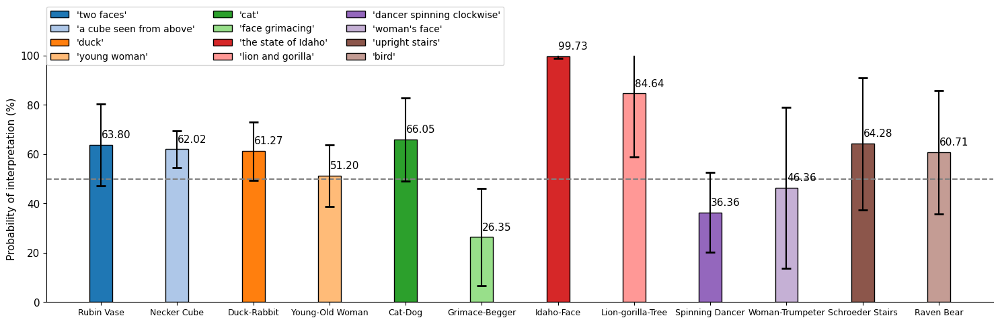

In [8]:
# Plot between-models averages
images = [f"{image_name}" for image_name in list(final_avg_dict.keys())]
labels = [f"'{image_category[image_name][0][0]}'"  for image_name in list(final_avg_dict.keys())]
probabilities = list(final_avg_dict.values())
# Extract probabilities of primary interpretation
primary_probs = []
primary_std = []
plt.rcParams.update({'font.size': 11})

for image_name, probs in final_avg_dict.items():
    if image_name == 'Takashima':
        continue

    primary_probs.append(np.mean(probs))
    primary_std.append(np.std(probs))

plt.figure(figsize=(15, 5))
# plt.xticks(rotation=45)
#set font size


cmap = plt.get_cmap("tab20")
colors = [ cmap(i % 20) for i in range(len(primary_probs))]
bars = []
for i, (prob, label, color) in enumerate(zip(primary_probs, labels, colors)):
    bar = plt.bar(i + 1, prob, color=color, width=0.3, edgecolor='black', label=label)
    bars.append(bar)

# Add the numbers on top of each bar
for i, prob in enumerate(primary_probs):
    plt.text(i + 1 + 0.2, prob + 2, f"{prob:.2f}", ha='center', va='bottom')

plt.ylabel("Probability of interpretation (%)")
plt.xticks(range(1, len(images) + 1), images, fontsize=9)
plt.axhline(y=50, color='gray', linestyle='--')  # Add horizontal line at y=50
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.ylim(0, 100)  # Set y-axis limits
plt.minorticks_off()
plt.legend(borderaxespad=0, bbox_to_anchor=(0,1.2), loc='upper left', fontsize=10, ncol=3)
# Adding error bars
plt.errorbar(range(1, len(primary_probs) + 1), primary_probs, yerr=primary_std, fmt='-', color='black', capsize=5, capthick=2, ls='none')

plt.tight_layout()
plt.savefig(f"/content/drive/My Drive/independent_thesis/categories_averages.pdf")
plt.show()


<ipython-input-13-39c1a2a537ac>:58: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.errorbar(range(1, len(primary_probs) + 1), primary_probs, yerr=primary_std, fmt='-', color='black', capsize=5, capthick=2, ls='none')


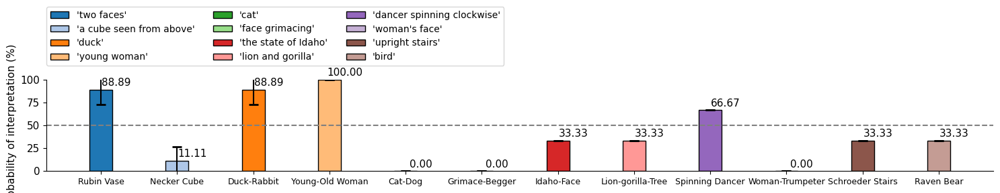

In [13]:
# Plot between-models averages
images = [f"{image_name}" for image_name in list(final_avg_dict.keys())]
labels = [f"'{image_category[image_name][0][0]}'"  for image_name in list(final_avg_dict.keys())]
probabilities = list(final_avg_dict.values())
# Extract probabilities of primary interpretation
primary_probs = []
primary_std = []
plt.rcParams.update({'font.size': 11})

human = json.load(open('/bistable_dataset.json'))

category2human = defaultdict(list)
for item in human:
  if 'takashima' in item["image_id"]:
    continue
  else:
    category = None
    for c, v in image_category.items():
      if item['image_id'] in v[1]:
        category = c
        break
    if category is None:
      continue
    category2human[category].append(item["human"])

for image_name, probs in final_avg_dict.items():
    if image_name == 'Takashima':
        continue
    primary_probs.append(np.mean([sum([h==0 for h in ch])*100/len(ch) for ch in category2human[image_name]]))
    primary_std.append(np.std([sum([h==0 for h in ch])*100/len(ch) for ch in category2human[image_name]]))


plt.figure(figsize=(15, 5))
# plt.xticks(rotation=45)
#set font size


cmap = plt.get_cmap("tab20")
colors = [ cmap(i % 20) for i in range(len(primary_probs))]
bars = []
for i, (prob, label, color) in enumerate(zip(primary_probs, labels, colors)):
    bar = plt.bar(i + 1, prob, color=color, width=0.3, edgecolor='black', label=label)
    bars.append(bar)

# Add the numbers on top of each bar
for i, prob in enumerate(primary_probs):
    plt.text(i + 1 + 0.2, prob + 2, f"{prob:.2f}", ha='center', va='bottom')

plt.ylabel("Probability of interpretation (%)")
plt.xticks(range(1, len(images) + 1), images, fontsize=9)
plt.axhline(y=50, color='gray', linestyle='--')  # Add horizontal line at y=50
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.ylim(0, 100)  # Set y-axis limits
plt.minorticks_off()
plt.legend(borderaxespad=0, bbox_to_anchor=(0,1.8), loc='upper left', fontsize=10, ncol=3)
# Adding error bars
plt.errorbar(range(1, len(primary_probs) + 1), primary_probs, yerr=primary_std, fmt='-', color='black', capsize=5, capthick=2, ls='none')

plt.tight_layout()
plt.savefig(f"/content/drive/My Drive/independent_thesis/categories_averages_human.pdf")
plt.show()

## Each image charted by brightness transformation
How do probability distributions vary for each brightness variation?

In [436]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from concurrent.futures import ThreadPoolExecutor

# Configuration
path = "/content/drive/My Drive/independent_thesis/results"
brightness_prefix = "brightness_transform_images_classification"
brightness_files = [file for file in os.listdir(path) if file.startswith(brightness_prefix) and file.endswith(".json")]
gamma_vals = [gamma / 100 if gamma not in [-100, 0] else int(gamma/100) for gamma in range(-100, 110, 10)]
# Mapping to store brightness data for each model
model_brightness_data = defaultdict(dict)

# Function to read and process a single brightness file
def process_brightness_file(filename):
    with open(os.path.join(path, filename), "r") as f:
        data = json.load(f)
    model_id = data['model_id']
    gamma = float(filename.split('_')[4].replace('.json', ''))
    if gamma not in gamma_vals:
        return
    model_brightness_data[model_id][gamma] = data['outputs']

# Read files concurrently
with ThreadPoolExecutor() as executor:
    executor.map(process_brightness_file, brightness_files)


# Function to compute probabilities for a given image category
def compute_brightness_probabilities(image_category_name, image_category_values):
    (interpretations, image_names) = image_category_values
    brightness_probabilities = defaultdict(list)

    for model_id, outputs_by_gamma in model_brightness_data.items():
        curr_model_probabilities = defaultdict(list)

        for gamma, outputs in outputs_by_gamma.items():
            for image_name in image_names:
                if image_name not in outputs:
                    from pdb import set_trace; set_trace()
                    continue
                interpretation_probs = outputs[image_name]
                if interpretations[0] in interpretation_probs:
                    curr_model_probabilities[gamma].append(interpretation_probs[interpretations[0]])

        for gamma, probabilities in curr_model_probabilities.items():
            mean_prob = np.mean(probabilities) * 100
            std_prob = np.std(probabilities) * 100
            brightness_probabilities[model_id].append((gamma, mean_prob, std_prob))
        brightness_probabilities[model_id] = sorted(brightness_probabilities[model_id], key=lambda x: x[0])

    return image_category_name, brightness_probabilities

<ipython-input-441-e84b9c733986>:69: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(model_brightness_data))


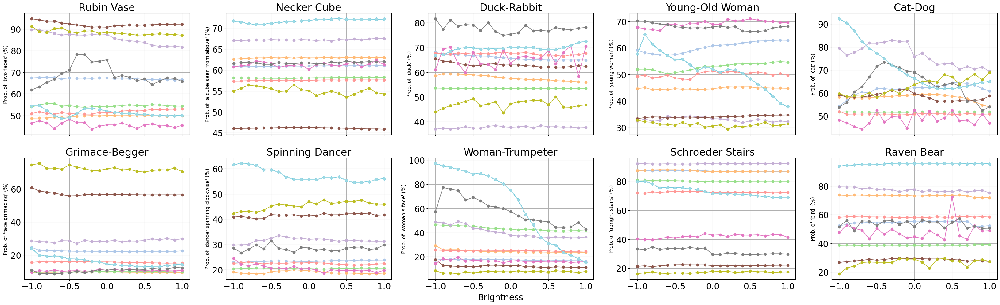

In [441]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from concurrent.futures import ThreadPoolExecutor

# Configuration
path = "/content/drive/My Drive/independent_thesis/results"
brightness_prefix = "brightness_transform_images_classification"
brightness_files = [file for file in os.listdir(path) if file.startswith(brightness_prefix) and file.endswith(".json")]
gamma_vals = [gamma / 100 if gamma not in [-100, 0] else int(gamma / 100) for gamma in range(-100, 110, 10)]

# Mapping to store brightness data for each model
model_brightness_data = defaultdict(dict)

#set font size
plt.rcParams.update({'font.size': 20})

# Function to read and process a single brightness file
def process_brightness_file(filename):
    with open(os.path.join(path, filename), "r") as f:
        data = json.load(f)
    model_id = data['model_id']
    gamma = float(filename.split('_')[4].replace('.json', ''))
    if gamma not in gamma_vals:
        return
    model_brightness_data[model_id][gamma] = data['outputs']

# Read files concurrently
with ThreadPoolExecutor() as executor:
    executor.map(process_brightness_file, brightness_files)

# Function to compute probabilities for a given image category
def compute_brightness_probabilities(image_category_name, image_category_values):
    (interpretations, image_names) = image_category_values
    brightness_probabilities = defaultdict(list)

    for model_id, outputs_by_gamma in model_brightness_data.items():
        curr_model_probabilities = defaultdict(list)

        for gamma, outputs in outputs_by_gamma.items():
            for image_name in image_names:
                if image_name not in outputs:
                    continue
                interpretation_probs = outputs[image_name]
                if interpretations[0] in interpretation_probs:
                    curr_model_probabilities[gamma].append(interpretation_probs[interpretations[0]])

        for gamma, probabilities in curr_model_probabilities.items():
            mean_prob = np.mean(probabilities) * 100
            std_prob = np.std(probabilities) * 100
            brightness_probabilities[model_id].append((gamma, mean_prob, std_prob))
        brightness_probabilities[model_id] = sorted(brightness_probabilities[model_id], key=lambda x: x[0])

    return brightness_probabilities

model2color = {}
# Example usage
# image_category = {'example_category': (['some_interpretation'], ['image1', 'image2', 'image3'])}
num_categories = len(image_category)-2
fig, axs = plt.subplots(nrows=2, ncols=num_categories//2, figsize=(6 * num_categories//2,10), sharex=True)
axs = axs.flatten()
# Ensure `axs` is a list for consistent indexing
if num_categories == 1:
    axs = [axs]

# Define a set of unique markers and colors
colors = plt.cm.get_cmap('tab20', len(model_brightness_data))
legend_labels = []
offset = 0
for idx, (image_category_name, values) in enumerate(image_category.items()):
    if 'takashima' in image_category_name.lower() or 'idaho' in image_category_name.lower() or 'lion' in image_category_name.lower():
      offset+=1
      continue  # Skip Takashima images

    brightness_probabilities = compute_brightness_probabilities(image_category_name, values)
    if 'lion' in image_category_name.lower():
      print(brightness_probabilities.keys())
    ax = axs[idx-offset]

    for model_idx, (model_name, data) in enumerate(brightness_probabilities.items()):
        x_values = [d[0] for d in data]
        y_values = [d[1] for d in data]
        std_values = [d[2] for d in data]
        marker = 'o'
        color = colors(model_idx)
        model2color[model_name] = color
        line = ax.plot(x_values, y_values, marker=marker, color=color, label= model_to_ids[model_name])

        # Collect unique legend labels for the common legend
        if idx == 0:
            legend_labels.append(line[0])

    ax.set_title(f"{image_category_name}")
    ax.set_ylabel(f"Prob. of '{values[0][0]}' (%)", fontsize=12)
    ax.grid(True)

# Add the common x-label and legend
fig.text(0.5, 0.0, "Brightness", ha='center')
# fig.legend(handles=legend_labels, ncols =6, loc='lower center', bbox_to_anchor=(0.5,-.13))
fig.tight_layout()  # Adjust to fit the common legend
plt.savefig(f"/content/drive/My Drive/independent_thesis/all_categories_brightness_analysis.pdf", bbox_inches='tight')
plt.show()


## Each image category charted by color and tint transformations
How do probability distributions vary for each color and tint variation?

['color_transform_images_generation_blue_1_openai_clip-vit-base-patch16.json', 'color_transform_images_generation_yellow_0_openai_clip-vit-base-patch16.json', 'color_transform_images_generation_yellow_0.1_openai_clip-vit-base-patch16.json', 'color_transform_images_generation_yellow_0.2_openai_clip-vit-base-patch16.json', 'color_transform_images_generation_yellow_0.3_openai_clip-vit-base-patch16.json', 'color_transform_images_generation_yellow_0.4_openai_clip-vit-base-patch16.json', 'color_transform_images_generation_yellow_0.5_openai_clip-vit-base-patch16.json', 'color_transform_images_generation_yellow_0.6_openai_clip-vit-base-patch16.json', 'color_transform_images_generation_yellow_0.7_openai_clip-vit-base-patch16.json', 'color_transform_images_generation_yellow_0.8_openai_clip-vit-base-patch16.json', 'color_transform_images_generation_yellow_0.9_openai_clip-vit-base-patch16.json', 'color_transform_images_generation_yellow_1_openai_clip-vit-base-patch16.json', 'color_transform_images

<ipython-input-442-95b190711bc5>:75: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(model_brightness_data))


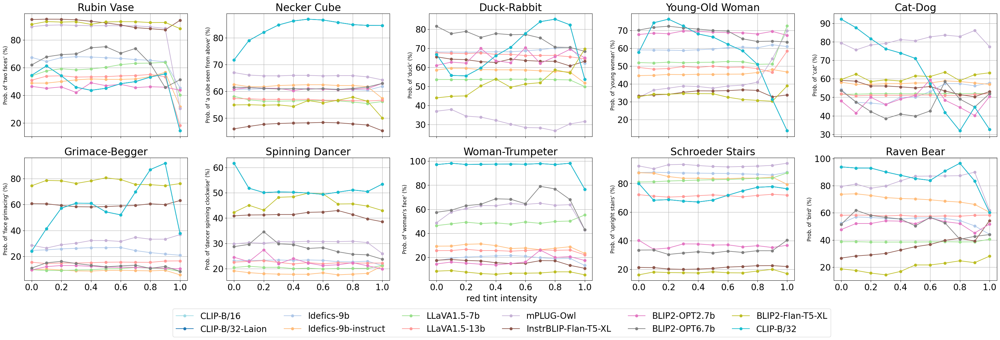

<Figure size 640x480 with 0 Axes>

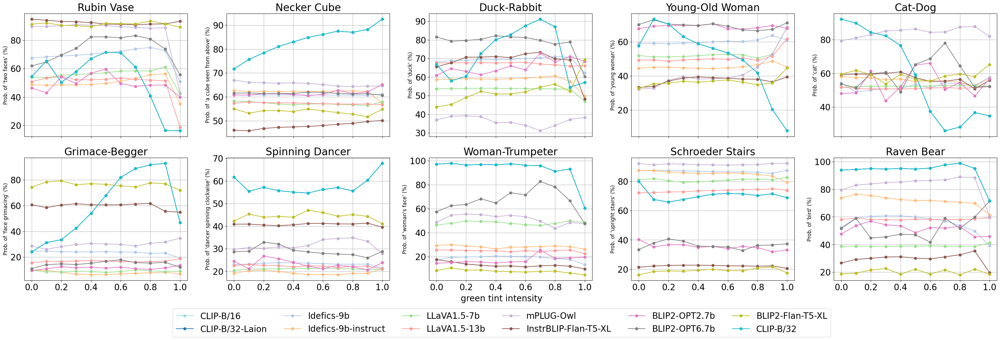

<Figure size 640x480 with 0 Axes>

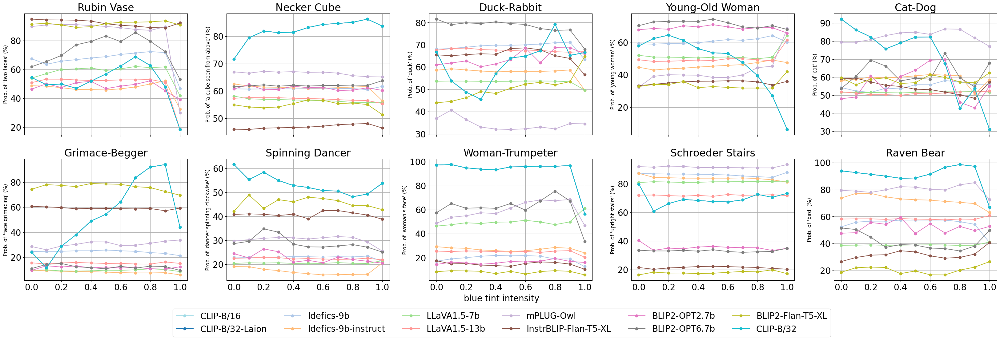

<Figure size 640x480 with 0 Axes>

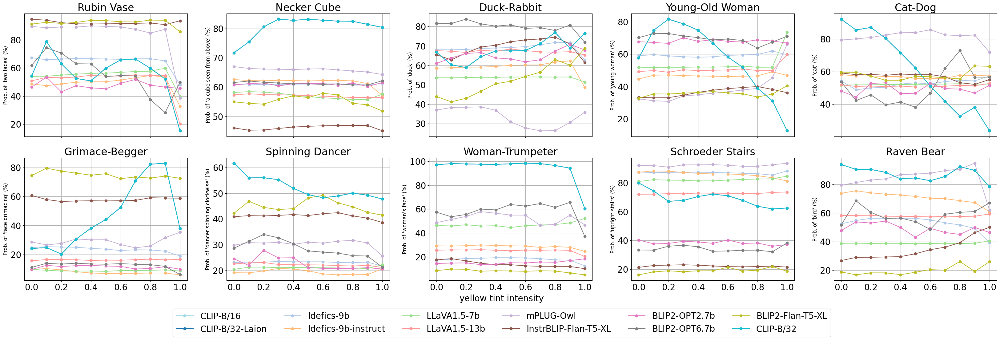

<Figure size 640x480 with 0 Axes>

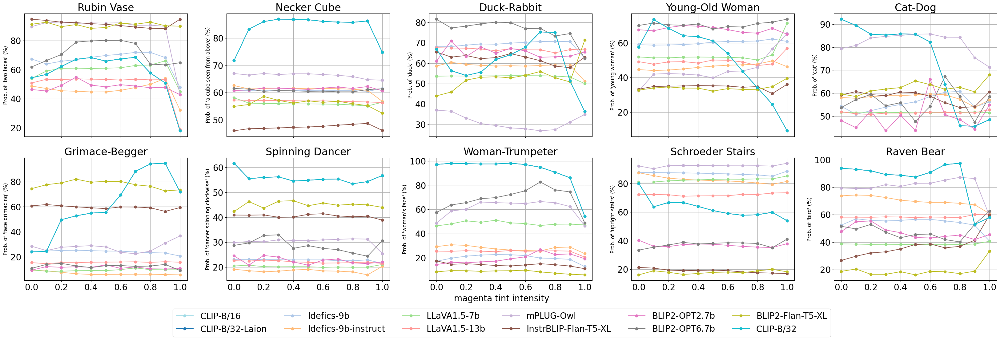

<Figure size 640x480 with 0 Axes>

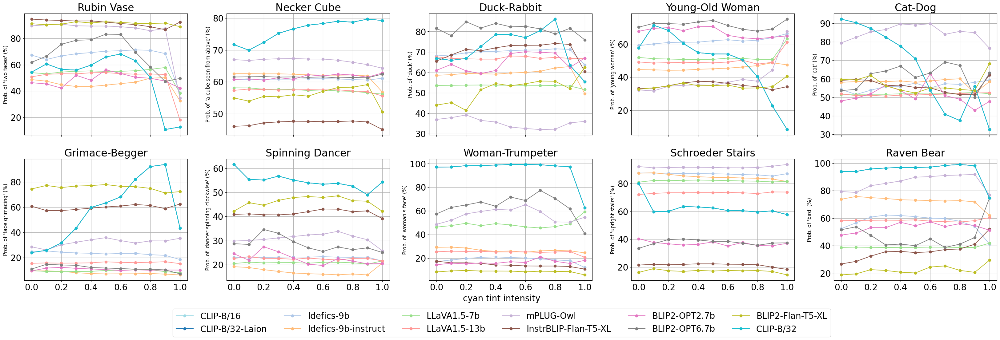

<Figure size 640x480 with 0 Axes>

In [442]:
path = "/content/drive/My Drive/independent_thesis/results"
files = os.listdir(path)

tint_colors = ["red", "green", "blue", "yellow", "magenta", "cyan"]

color_files = [file for file in files if file.startswith("color_transform_images_generation") and file.endswith(".json")]
print(color_files)
gamma_vals = [gamma / 100 if gamma not in [-100, 0] else int(gamma / 100) for gamma in range(0, 110, 10)]

# Dictionary to store accumulated probabilities for each interpretation across models
color_probabilities = defaultdict(lambda: defaultdict(list))

#import os
import json
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from concurrent.futures import ThreadPoolExecutor


# Mapping to store brightness data for each model
model_brightness_data = defaultdict(dict)

#set font size
plt.rcParams.update({'font.size': 20})

# Function to read and process a single brightness file
def process_color_file(filename):
    with open(os.path.join(path, filename), "r") as f:
        data = json.load(f)
    model_id = data['model_id']
    color, gamma =  filename.split('_')[4].replace('.json', ''), float(filename.split('_')[5].replace('.json', ''))
    if gamma not in gamma_vals:
        return
    if color not in model_brightness_data[model_id]:
        model_brightness_data[model_id][color] = {}
    model_brightness_data[model_id][color][gamma] = data['outputs']

for color_file in color_files:
    process_color_file(color_file)
# # Read files concurrently
# with ThreadPoolExecutor() as executor:
#     executor.map(process_color_file, color_files)

print(model_brightness_data)
# Function to compute probabilities for a given image category
def compute_color_probabilities(image_category_name, image_category_values):
    (interpretations, image_names) = image_category_values
    brightness_probabilities ={c:defaultdict(list) for c in tint_colors}
    for model_id, outputs_by_color in model_brightness_data.items():
        for color, outputs_by_gamma in outputs_by_color.items():
          curr_model_probabilities = defaultdict(list)

          for gamma, outputs in outputs_by_gamma.items():
              for image_name in image_names:
                  if image_name not in outputs:
                      continue
                  interpretation_probs = outputs[image_name]
                  if interpretations[0] in interpretation_probs:
                      curr_model_probabilities[gamma].append(interpretation_probs[interpretations[0]])

          for gamma, probabilities in curr_model_probabilities.items():
              mean_prob = np.mean(probabilities) * 100
              std_prob = np.std(probabilities) * 100
              brightness_probabilities[color][model_id].append((gamma, mean_prob, std_prob))
          brightness_probabilities[color][model_id] = sorted(brightness_probabilities[color][model_id], key=lambda x: x[0])

    return brightness_probabilities

# Example usage
# image_category = {'example_category': (['some_interpretation'], ['image1', 'image2', 'image3'])}


# Define a set of unique markers and colors
colors = plt.cm.get_cmap('tab20', len(model_brightness_data))
legend_labels = []

average_brightness_probabilities = {model_name: defaultdict(list) for model_name in model_to_ids.keys()}
for color_idx,color in enumerate(tint_colors):
      num_categories = len(image_category)-2
      fig, axs = plt.subplots(nrows=2, ncols=num_categories//2, figsize=(6 * num_categories//2,10), sharex=True)
      axs = axs.flatten()
      # Ensure `axs` is a list for consistent indexing
      if num_categories == 1:
          axs = [axs]
      offset = 0
      for idx, (image_category_name, values) in enumerate(image_category.items()):
            if 'takashima' in image_category_name.lower() or 'idaho' in image_category_name.lower() or 'lion' in image_category_name.lower():
              offset+=1
              continue  # Skip Takashima images
            brightness_probabilities = compute_color_probabilities(image_category_name, values)

            ax = axs[idx-offset]
            for model_idx, (model_name, data) in enumerate(brightness_probabilities[color].items()):
                x_values = [d[0] for d in data]
                average_brightness_probabilities[model_name][image_category_name].append([d[1] for d in data])
                y_values = [d[1] for d in data]
                std_values = [d[2] for d in data]
                marker = 'o'
                line_color = model2color[model_name]
                line = ax.plot(x_values, y_values, marker=marker, color=line_color, label= model_to_ids[model_name])

                # Collect unique legend labels for the common legend
                if idx == 0 and color_idx == 0:
                    legend_labels.append(line[0])
            ax.set_title(f"{image_category_name}")
            ax.set_ylabel(f"Prob. of '{values[0][0]}' (%)", fontsize=12)
            ax.grid(True)

      # Add the common x-label and legend
      fig.text(0.5, 0.0, f"{color} tint intensity", ha='center')
      fig.legend(handles=legend_labels, ncols =6, loc='lower center', bbox_to_anchor=(0.5,-.13))
      fig.tight_layout()  # Adjust to fit the common legend
      plt.savefig(f"/content/drive/My Drive/independent_thesis/all_categories_tint_analysis_{color}.pdf", bbox_inches='tight')
      plt.show()
      plt.clf()


[54.40707505 62.03403903 56.01220686 54.36279931 56.87811412 60.84285565
 63.86508834 62.95661339 54.09800551 38.9390343  15.82864846]
[ 0.          8.99071009  5.1892099   7.19129106  8.97512343  8.49557648
  7.44408032  6.48671097  7.18448685 18.1242308   2.01980019]
[54.40707505 62.03403903 56.01220686 54.36279931 56.87811412 60.84285565
 63.86508834 62.95661339 54.09800551 38.9390343  15.82864846]
[ 0.          8.99071009  5.1892099   7.19129106  8.97512343  8.49557648
  7.44408032  6.48671097  7.18448685 18.1242308   2.01980019]
[54.40707505 62.03403903 56.01220686 54.36279931 56.87811412 60.84285565
 63.86508834 62.95661339 54.09800551 38.9390343  15.82864846]
[ 0.          8.99071009  5.1892099   7.19129106  8.97512343  8.49557648
  7.44408032  6.48671097  7.18448685 18.1242308   2.01980019]
[67.35180418 64.99906282 66.77818828 67.65994231 68.35239033 68.95158026
 69.42149301 70.10968626 70.31927903 68.38553548 46.26227568]
[1.42108547e-14 1.65841373e+00 1.06913650e+00 9.7520576

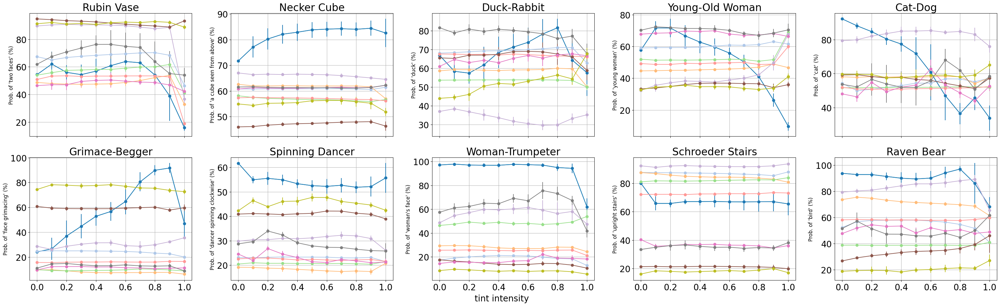

<Figure size 640x480 with 0 Axes>

In [446]:
num_categories = len(image_category) - 2
fig, axs = plt.subplots(nrows=2, ncols=num_categories//2, figsize=(6 * num_categories//2,10), sharex=True)
axs = axs.flatten()
# Ensure `axs` is a list for consistent indexing
if num_categories == 1:
    axs = [axs]
offset = 0
for idx, (image_category_name, values) in enumerate(image_category.items()):
      if 'takashima' in image_category_name.lower() or 'idaho' in image_category_name.lower() or 'lion' in image_category_name.lower():
        offset+=1
        continue  # Skip Takashima images
      # brightness_probabilities = compute_color_probabilities(image_category_name, values)

      ax = axs[idx-offset]
      for model_idx, model_name in enumerate(model_to_ids.keys()):

          x_values = gamma_vals
          if isinstance(average_brightness_probabilities[model_name][image_category_name][0], list):
            y_values = np.array(average_brightness_probabilities[model_name][image_category_name]).mean(0)
            y_errs = np.array(average_brightness_probabilities[model_name][image_category_name]).std(0)

          else:
            y_values = average_brightness_probabilities[model_name][image_category_name]
            y_errs = np.zeros_like(y_values)
          print(y_values)
          print(y_errs)
          marker = 'o'
          line_color = model2color[model_name]
          # line = ax.plot(x_values, y_values, marker=marker, color=line_color, label=model_name)
          line = ax.errorbar(x_values, y_values, yerr=y_errs, fmt='o', color=line_color, label= model_to_ids[model_name], ls='-')

          # Collect unique legend labels for the common legend
          if idx == 0:
              legend_labels.append(line[0])
      ax.set_title(f"{image_category_name}")
      ax.set_ylabel(f"Prob. of '{values[0][0]}' (%)", fontsize=12)
      ax.grid(True)

# Add the common x-label and legend
fig.text(0.5, 0.0, f"tint intensity", ha='center')
# fig.legend(handles=legend_labels, ncols =6, loc='lower center', bbox_to_anchor=(0.5,-.13))
fig.tight_layout()  # Adjust to fit the common legend
plt.savefig(f"/content/drive/My Drive/independent_thesis/all_categories_tint_analysis_average.pdf", bbox_inches='tight')
plt.show()
plt.clf()

In [447]:
# Mount Google Drive
drive.mount('/content/drive')

path = "/content/drive/My Drive/independent_thesis/results"
files = os.listdir(path)

image_category_synonyms = {
    "Rubin Vase": (("profiles", "container"), ["rubin_vase_1.png", "rubin_vase_2.png", "rubin_vase_3.png"]),
    "Necker Cube": (("geometric shape from overhead","geometric shape from beneath"), ["necker_cube_1.png", "necker_cube_2.png", "necker_lattice.png"]),
    "Duck-Rabbit": (("waterfowl", "bunny"), ["duck_rabbit_1.png", "duck_rabbit_2.png", "duck_rabbit_3.png"]),
    "Young-Old Woman": (("maiden", "elder"), ["young_old_woman_1.jpeg", "young_old_woman_2.jpeg", "young_old_woman_3.jpeg"]),
    "Cat-Dog": (("feline", "canine"), ["cat_dog_1.png"]),
    "Grimace-Begger": (("facial contortion", "panhandler"), ["grimace_begger_1.jpeg"]),
    "Idaho-Face": (("American state", "visage"),["idaho_face_1.png"]),
    "Lion-gorilla-Tree": (("big cat and ape", "plant"), ["lion_gorilla_tree_1.jpeg"]),
    "Spinning Dancer": (("performer rotating right", "performer rotating left"), ["spining_dancer_1.jpeg"]),
    "Woman-Trumpeter": (("female visage", "jazz musician"), ["woman_trumpeter_1.jpeg"]),
    "Schroeder Stairs": (("vertical staircase", "lateral staircase"), ["schroeder_stairs_1.png", "schroeder_stairs_2.png"]),
    "Raven Bear": (("avian", "bruin"), ["raven_bear_1.png"]),
    "Takashima": (("profiles", "container"), ["takashima_1.png", "takashima_2.png", "takashima_3.png", "takashima_4.png", "takashima_5.png", "takashima_6.png", "takashima_7.png", "takashima_8.png"])
}
# Filter the files to only include JSON files that start with "original_images"
json_files = [file for file in files if file.startswith("synonyms_classification_")  and file.endswith(".json")]

# Load the JSON files into a list
data = []
for file in json_files:
    with open(os.path.join(path, file), "r") as f:
        data.append(json.load(f))

# Dictionary to store accumulated probabilities for each interpretation
interpretation_probabilities = defaultdict(lambda: defaultdict(list))

# Count of models
num_models = len(data)

# Iterate over each model's results
for model_result in data:
    # Extract model_id and outputs
    model_id = model_result['model_id']
    outputs = model_result['outputs']

    # Iterate over each image's interpretations and probabilities
    for image_name, interpretation_probs in outputs.items():
        # Iterate over each interpretation and its probability
        for interpretation, probability in interpretation_probs.items():
            # Accumulate probabilities
            interpretation_probabilities[image_name][interpretation].append(probability)

# # Calculate average probabilities
# for image_name, probabilities in interpretation_probabilities.items():
#     for interpretation in probabilities:
        # interpretation_probabilities[image_name][interpretation] /= num_models

# Displat results in table
table_data = []
for image_name, probabilities in interpretation_probabilities.items():
    for interpretation, probability in probabilities.items():
        table_data.append([image_name, interpretation, sum(probability)/len(probability)])

# Create the table
table = tabulate(table_data, headers=['Image', 'Interpretation', 'Average Probability'], tablefmt='grid')

# Print the table
print(table)

# # Print average probabilities
# for image_name, probabilities in interpretation_probabilities.items():
#     print(f"Image: {image_name}")
#     for interpretation, probability in probabilities.items():
#         print(f"Interpretation: {interpretation}, Average Probability: {probability}")
#     print()



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
+--------------------------+-------------------------------+-----------------------+
| Image                    | Interpretation                |   Average Probability |
+==========================+===============================+=======================+
| cat_dog_1.png            | feline                        |            0.573595   |
+--------------------------+-------------------------------+-----------------------+
| cat_dog_1.png            | canine                        |            0.426405   |
+--------------------------+-------------------------------+-----------------------+
| duck_rabbit_1.png        | waterfowl                     |            0.803905   |
+--------------------------+-------------------------------+-----------------------+
| duck_rabbit_1.png        | bunny                         |            0.196095   |
+--------------------

In [ ]:
# Dictionary to store accumulated probabilities for each interpretation within a model
interpretation_probabilities_within_model = defaultdict(lambda: defaultdict(list))

# Dictionary to store accumulated probabilities for each interpretation across models
interpretation_probabilities_across_models = defaultdict(list)

# Iterate over each model's results
for model_result in data:
    # Extract model_id and outputs
    model_id = model_result['model_id']
    outputs = model_result['outputs']

    # Iterate over each image's interpretations and probabilities
    for image_category_name, (interpretations, image_names) in image_category.items():
        # Get the image names for the current image category
        for image_name in image_names:
            interpretation_probs = outputs[image_name]
            # Iterate over each interpretation and its probability
            for interpretation, probability in interpretation_probs.items():
                # Accumulate probabilities within each model
                interpretation_probabilities_within_model[model_id][(image_category_name, interpretation)].append(probability)
                # Accumulate probabilities across models
                interpretation_probabilities_across_models[(image_category_name, interpretation)].append(probability)

# Convert lists to numpy arrays
for model_id, probabilities in interpretation_probabilities_within_model.items():
    for (image_category_name, interpretation), probs_list in probabilities.items():
        interpretation_probabilities_within_model[model_id][(image_category_name, interpretation)] = np.array(probs_list)

for key, probs_list in interpretation_probabilities_across_models.items():
    interpretation_probabilities_across_models[key] = np.array(probs_list)

# Print average probabilities within each model
print("Average probabilities within each model:")
for model_id, probabilities in interpretation_probabilities_within_model.items():
    print(f"Model ID: {model_id}")
    for (image_category_name, interpretation), probs_array in probabilities.items():
        avg_probability = np.mean(probs_array)
        print(f"Image Category: {image_category_name}, Interpretation: {interpretation}, Average Probability: {avg_probability}")
    print()

# Print average probabilities across all models
print("Average probabilities across all models:")
for (image_category_name, interpretation), probs_array in interpretation_probabilities_across_models.items():
    avg_probability = np.mean(probs_array)
    print(f"Image Category: {image_category_name}, Interpretation: {interpretation}, Average Probability: {avg_probability}")


In [449]:
model_to_ids = {
    "openai/clip-vit-base-patch32":"CLIP-B/32",
    "openai/clip-vit-base-patch16":"CLIP-B/16",
    "laion/CLIP-ViT-B-32-laion2B-s34B-b79K":"CLIP-B/32-Laion",
    "HuggingFaceM4/idefics-9b":"Idefics-9b",
    "HuggingFaceM4/idefics-9b-instruct": "Idefics-9b-instruct",
    "llava-hf/llava-1.5-7b-hf":"LLaVA1.5-7b",
    "llava-hf/llava-1.5-13b-hf":"LLaVA1.5-13b",
    "MAGAer13/mplug-owl-llama-7b":"mPLUG-Owl",
    "Salesforce/instructblip-flan-t5-xl":"InstrBLIP-Flan-T5-XL",
    "Salesforce/blip2-opt-2.7b":"BLIP2-OPT2.7b",
    "Salesforce/blip2-opt-6.7b":"BLIP2-OPT6.7b",
    "Salesforce/blip2-flan-t5-xl":"BLIP2-Flan-T5-XL",
  }


import numpy as np

final_models_dict = {}
final_avg_dict = defaultdict(list)

synonyms = {
    image_category_name: []
    for image_category_name in image_category
}



for model_id, probabilities in interpretation_probabilities_within_model.items():
    for (image_category_name, interpretation), probability in probabilities.items():
      if interpretation == image_category_synonyms[image_category_name][0][0]:
          final_models_dict[(model_id, image_category_name)] = interpretation_probabilities_within_model[model_id][(image_category_name, interpretation)]

grouped_probs = {}
model_names = model_to_ids.values()
for (model, image_category_name), probability in final_models_dict.items():
    if 'takashima' in image_category_name.lower():
        continue
    if model not in model_to_ids:
        continue
    model = model_to_ids[model]
    if image_category_name not in grouped_probs:
        grouped_probs[image_category_name] = {}
    grouped_probs[image_category_name][model] = probability
    final_avg_dict[image_category_name].append(np.mean(probability*100))

profiles
[98.66046309 98.66046309 98.66046309 72.74239063 35.37123998 68.78268719
 48.14167718 53.91757786 24.96110847 99.42537149 99.08335805 23.62468143]
geometric shape from overhead
[47.68281678 47.68281678 47.68281678 48.76330296 56.20666941 74.61432417
 55.83807826 57.71510402 54.16799585 58.13022852 49.60943262 48.94278844]
waterfowl
[83.63330563 83.63330563 83.63330563 86.95743481 91.29347603 91.91625118
 83.40147734 74.5561401  67.07497835 86.01501584 96.65531119 40.93534946]
maiden
[54.39398487 54.39398487 54.39398487 99.03054436 98.64835739 98.83396228
 99.66747165 99.97101426 92.31122136 31.71996474 67.47068167 86.44977411]
feline
[88.97615671 88.97615671 88.97615671 41.86969101 52.92633772  6.52998537
 26.19433403 81.37449622 43.39814782 70.41601539 58.32033753 40.35668671]
facial contortion
[98.65211248 98.65211248 98.65211248 99.74589944 99.86646175 99.94333386
 99.58198071 99.97468591 62.84074187 96.37799859 98.13822508 72.33095169]
American state
[99.49276447 99.492764

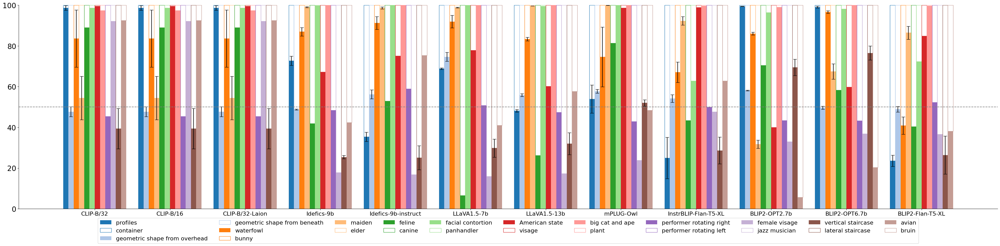

In [450]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming final_models_dict, model_to_ids, and image_category are already defined


# Prepare the colormap for different colors
cmap = plt.get_cmap("tab20")  # Colormap with 10 different colors

# Prepare the figure
fig, ax = plt.subplots(figsize=(40, 10))

# Initialize bar index for each model
bar_width = 0.07
bar_positions = np.arange(len(grouped_probs))

# Loop through each model name and plot bars for each image category
for i, (image_category_name, probs) in enumerate(grouped_probs.items()):
    if image_category_name == 'Takashima' :
        continue

    # Extract probabilities
    probabilities = np.array(list(probs.values()))
    primary_interpretation = image_category_synonyms[image_category_name][0][0]
    secondary_interpretation = image_category_synonyms[image_category_name][0][1]
    print(primary_interpretation)

    # Calculate probabilities and standard deviations
    primary_probs = probabilities.mean(axis=1) * 100
    primary_std = probabilities.std(axis=1) * 100
    secondary_probs = [100 - p1 for p1 in primary_probs]

    print(primary_probs)

    # Plot bars for this image category
    color = cmap(i % 20)  # Use a different color for each bar
    # print(primary_probs)
    bar1 = ax.bar(bar_positions + ((i) * bar_width), primary_probs, width=bar_width, label=primary_interpretation, color=color)
    ax.bar(bar_positions + ((i) * bar_width), secondary_probs, width=bar_width, bottom=primary_probs, label=secondary_interpretation, color='white', edgecolor=color)

    # Add error bars
    for j, rect in enumerate(bar1):
        if len(probabilities[j]) == 1:
          continue
        height = rect.get_height()
        ax.errorbar(rect.get_x() + rect.get_width() / 2, height, yerr=primary_std[j], fmt='-', color='black', capsize=5, capthick=1)

# Set the title and labels
# ax.set_title("Combined Models Plot", fontsize=15)
ax.set_xticks(bar_positions + (len(grouped_probs) - 1) * bar_width / 2)
ax.set_xticklabels(model_names, rotation=0, fontsize=16)
ax.axhline(y=50, color='gray', linestyle='--')
ax.set_ylim(0, 100)
ax.minorticks_off()
ax.legend(bbox_to_anchor=(0.5, -.17), loc='lower center', borderaxespad=0, fontsize=16, ncol=11)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Adjust layout to prevent overlapping elements
plt.tight_layout()
plt.savefig("/content/drive/My Drive/independent_thesis/combined_models_plot_synonyms.pdf")
plt.show()

<ipython-input-451-4d5f0deece31>:42: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.errorbar(range(1, len(primary_probs) + 1), primary_probs, yerr=primary_std, fmt='-', color='black', capsize=5, capthick=2, ls='none')


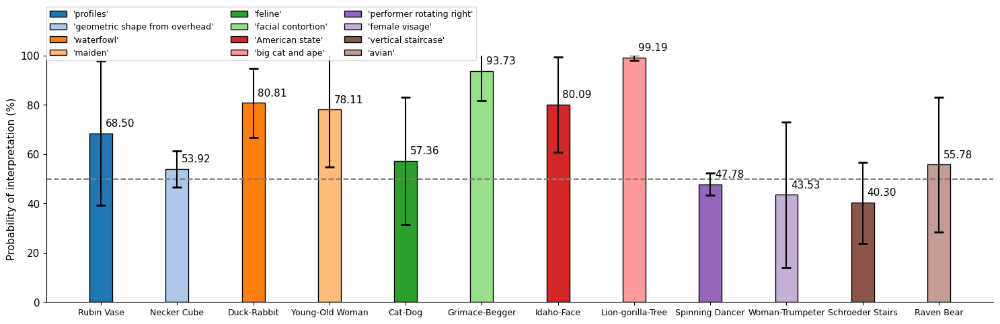

In [451]:
# Plot between-models averages
images = [f"{image_name}" for image_name in list(final_avg_dict.keys())]
labels = [f"'{image_category_synonyms[image_name][0][0]}'"  for image_name in list(final_avg_dict.keys())]
probabilities = list(final_avg_dict.values())
# Extract probabilities of primary interpretation
primary_probs = []
primary_std = []

for image_name, probs in final_avg_dict.items():
    if image_name == 'Takashima':
        continue

    primary_probs.append(np.mean(probs))
    primary_std.append(np.std(probs))

plt.figure(figsize=(15, 5))
# plt.xticks(rotation=45)
#set font size
plt.rcParams.update({'font.size': 11})


cmap = plt.get_cmap("tab20")
colors = [ cmap(i % 20) for i in range(len(primary_probs))]
bars = []
for i, (prob, label, color) in enumerate(zip(primary_probs, labels, colors)):
    bar = plt.bar(i + 1, prob, color=color, width=0.3, edgecolor='black', label=label)
    bars.append(bar)

# Add the numbers on top of each bar
for i, prob in enumerate(primary_probs):
    plt.text(i + 1 + 0.25, prob + 2, f"{prob:.2f}", ha='center', va='bottom')

plt.ylabel("Probability of interpretation (%)")
plt.xticks(range(1, len(images) + 1), images, fontsize=9)
plt.axhline(y=50, color='gray', linestyle='--')  # Add horizontal line at y=50
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.ylim(0, 100)  # Set y-axis limits
plt.minorticks_off()
plt.legend(borderaxespad=0, bbox_to_anchor=(0,1.2), loc='upper left', fontsize=9, ncol=3)
# Adding error bars
plt.errorbar(range(1, len(primary_probs) + 1), primary_probs, yerr=primary_std, fmt='-', color='black', capsize=5, capthick=2, ls='none')

plt.tight_layout()
plt.savefig(f"/content/drive/My Drive/independent_thesis/categories_averages_synonyms.pdf")
plt.show()

<ipython-input-454-671770ffa7fa>:69: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(model_brightness_data))
<ipython-input-454-671770ffa7fa>:97: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(x_values, rotation=45, ha='right', fontsize=12)


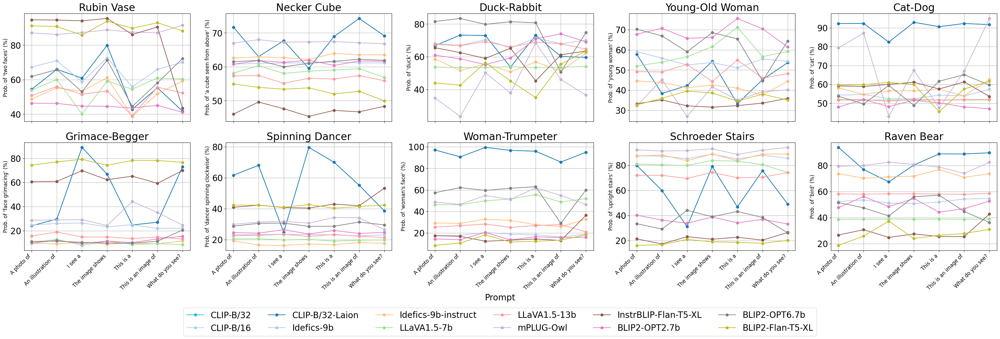

In [454]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from concurrent.futures import ThreadPoolExecutor

# Configuration
path = "/content/drive/My Drive/independent_thesis/results"
brightness_prefix = "prompt_variation"
brightness_files = [file for file in os.listdir(path) if file.startswith(brightness_prefix) and file.endswith(".json")]
gamma_vals = list(set([file.split('_')[3].replace("{}", "").strip() for file in brightness_files]))

# Mapping to store brightness data for each model
model_brightness_data = defaultdict(dict)

#set font size
plt.rcParams.update({'font.size': 20})

# Function to read and process a single brightness file
def process_brightness_file(filename):
    with open(os.path.join(path, filename), "r") as f:
        data = json.load(f)
    model_id = data['model_id']
    gamma = filename.split('_')[3].replace("{}", "").strip()
    if gamma not in gamma_vals:
        return
    model_brightness_data[model_id][gamma] = data['outputs']

# Read files concurrently
with ThreadPoolExecutor() as executor:
    executor.map(process_brightness_file, brightness_files)

# Function to compute probabilities for a given image category
def compute_brightness_probabilities(image_category_name, image_category_values):
    (interpretations, image_names) = image_category_values
    brightness_probabilities = defaultdict(list)

    for model_id, outputs_by_gamma in model_brightness_data.items():
        curr_model_probabilities = defaultdict(list)

        for gamma, outputs in outputs_by_gamma.items():
            for image_name in image_names:
                if image_name not in outputs:
                    continue
                interpretation_probs = outputs[image_name]
                if interpretations[0] in interpretation_probs:
                    curr_model_probabilities[gamma].append(interpretation_probs[interpretations[0]])

        for gamma, probabilities in curr_model_probabilities.items():
            mean_prob = np.mean(probabilities) * 100
            std_prob = np.std(probabilities) * 100
            brightness_probabilities[model_id].append((gamma, mean_prob, std_prob))
        brightness_probabilities[model_id] = sorted(brightness_probabilities[model_id], key=lambda x: x[0])

    return brightness_probabilities

# model2color = {}
# Example usage
# image_category = {'example_category': (['some_interpretation'], ['image1', 'image2', 'image3'])}
num_categories = len(image_category)-2
fig, axs = plt.subplots(nrows=2, ncols=num_categories//2, figsize=(6 * num_categories//2,10), sharex=True)
axs = axs.flatten()
# Ensure `axs` is a list for consistent indexing
if num_categories == 1:
    axs = [axs]

# Define a set of unique markers and colors
colors = plt.cm.get_cmap('tab20', len(model_brightness_data))
legend_labels = []
offset = 0
for idx, (image_category_name, values) in enumerate(image_category.items()):
    if 'takashima' in image_category_name.lower() or 'idaho' in image_category_name.lower() or 'lion' in image_category_name.lower():
      offset+=1
      continue  # Skip Takashima images

    brightness_probabilities = compute_brightness_probabilities(image_category_name, values)
    if 'lion' in image_category_name.lower():
      print(brightness_probabilities.keys())
    ax = axs[idx-offset]

    for model_idx, (model_name, data) in enumerate(brightness_probabilities.items()):
        x_values = [d[0] for d in data]
        y_values = [d[1] for d in data]
        std_values = [d[2] for d in data]
        marker = 'o'
        color =  model2color[model_name]
        line = ax.plot(x_values, y_values, marker=marker, color=color, label= model_to_ids[model_name])

        # Collect unique legend labels for the common legend
        if idx == 0:
            legend_labels.append(line[0])

    ax.set_title(f"{image_category_name}")
    ax.set_ylabel(f"Prob. of '{values[0][0]}' (%)", fontsize=12)
    #rotate xticks
    ax.set_xticklabels(x_values, rotation=45, ha='right', fontsize=12)
    ax.grid(True)

# Add the common x-label and legend
fig.text(0.5, 0.0, "Prompt", ha='center')
fig.legend(handles=legend_labels, ncols =6, loc='lower center', bbox_to_anchor=(0.5,-.13))
fig.tight_layout()  # Adjust to fit the common legend
plt.savefig(f"/content/drive/My Drive/independent_thesis/all_categories_prompt_analysis.pdf", bbox_inches='tight')
plt.show()


<ipython-input-453-ca883a40f6a6>:65: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(model_brightness_data))
<ipython-input-453-ca883a40f6a6>:176: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.errorbar(range(1, len(primary_probs) + 1), primary_probs, yerr=primary_std, fmt='-', color='black', capsize=5, capthick=2, ls='none')


dict_keys(['openai/clip-vit-base-patch32', 'openai/clip-vit-base-patch16', 'laion/CLIP-ViT-B-32-laion2B-s34B-b79K', 'HuggingFaceM4/idefics-9b', 'HuggingFaceM4/idefics-9b-instruct', 'llava-hf/llava-1.5-7b-hf', 'llava-hf/llava-1.5-13b-hf', 'MAGAer13/mplug-owl-llama-7b', 'Salesforce/instructblip-flan-t5-xl', 'Salesforce/blip2-opt-2.7b', 'Salesforce/blip2-opt-6.7b', 'Salesforce/blip2-flan-t5-xl'])


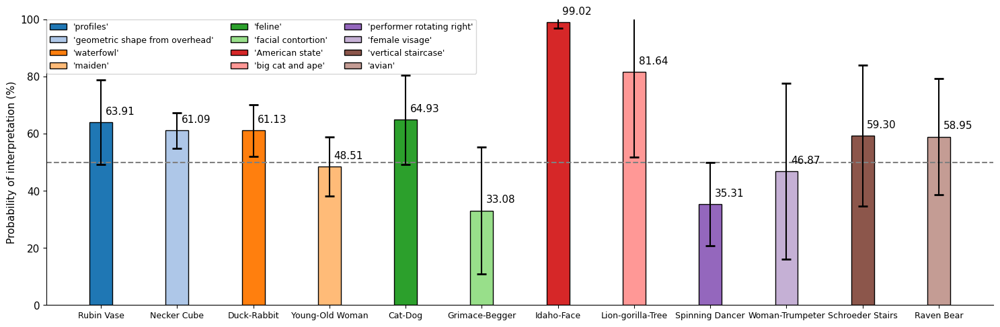

In [453]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from concurrent.futures import ThreadPoolExecutor

# Configuration
path = "/content/drive/My Drive/independent_thesis/results"
brightness_prefix = "prompt_variation"
brightness_files = [file for file in os.listdir(path) if file.startswith(brightness_prefix) and file.endswith(".json")]
gamma_vals = list(set([file.split('_')[3].replace("{}", "").strip() for file in brightness_files]))

# Mapping to store brightness data for each model
model_brightness_data = defaultdict(dict)

#set font size
plt.rcParams.update({'font.size': 20})

# Function to read and process a single brightness file
def process_brightness_file(filename):
    with open(os.path.join(path, filename), "r") as f:
        data = json.load(f)
    model_id = data['model_id']
    gamma = filename.split('_')[3].replace("{}", "").strip()
    if gamma not in gamma_vals:
        return
    model_brightness_data[model_id][gamma] = data['outputs']

# Read files concurrently
with ThreadPoolExecutor() as executor:
    executor.map(process_brightness_file, brightness_files)

# Function to compute probabilities for a given image category
def compute_brightness_probabilities(image_category_name, image_category_values):
    (interpretations, image_names) = image_category_values
    brightness_probabilities = defaultdict(list)

    for model_id, outputs_by_gamma in model_brightness_data.items():
        curr_model_probabilities = defaultdict(list)

        for gamma, outputs in outputs_by_gamma.items():
            for image_name in image_names:
                if image_name not in outputs:
                    continue
                interpretation_probs = outputs[image_name]
                if interpretations[0] in interpretation_probs:
                    curr_model_probabilities[gamma].append(interpretation_probs[interpretations[0]])

        for gamma, probabilities in curr_model_probabilities.items():
            mean_prob = np.mean(probabilities) * 100
            std_prob = np.std(probabilities) * 100
            brightness_probabilities[model_id].append((gamma, mean_prob, std_prob))
        brightness_probabilities[model_id] = sorted(brightness_probabilities[model_id], key=lambda x: x[0])

    return brightness_probabilities

# model2color = {}
# Example usage
# image_category = {'example_category': (['some_interpretation'], ['image1', 'image2', 'image3'])}
num_categories = len(image_category)-2


# Define a set of unique markers and colors
colors = plt.cm.get_cmap('tab20', len(model_brightness_data))
legend_labels = []
offset = 0
averages = defaultdict(list)
for idx, (image_category_name, values) in enumerate(image_category.items()):
    if 'takashima' in image_category_name.lower():
      offset+=1
      continue  # Skip Takashima images

    brightness_probabilities = compute_brightness_probabilities(image_category_name, values)
    if 'lion' in image_category_name.lower():
      print(brightness_probabilities.keys())

    for model_idx, (model_name, data) in enumerate(brightness_probabilities.items()):
        averages[image_category_name].append(sum([d[1] for d in data])/len([d[1] for d in data]))


from google.colab import drive
import os
import json
from collections import defaultdict
from IPython.display import Image
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
import matplotlib.colors as mcolors
import numpy as np
from tabulate import tabulate
import pandas as pd

# Define image categories
image_category = {
    "Rubin Vase": (("two faces", "vase"), ["rubin_vase_1.png", "rubin_vase_2.png", "rubin_vase_3.png"]),
    "Necker Cube": (("a cube seen from above", "a cube seen from below"), ["necker_cube_1.png", "necker_cube_2.png", "necker_lattice.png"]),
    "Duck-Rabbit": (("duck", "rabbit"), ["duck_rabbit_1.png", "duck_rabbit_2.png", "duck_rabbit_3.png"]),
    "Young-Old Woman": (("young woman", "old woman"), ["young_old_woman_1.jpeg", "young_old_woman_2.jpeg", "young_old_woman_3.jpeg"]),
    "Cat-Dog": (("cat", "dog"), ["cat_dog_1.png"]),
    "Grimace-Begger": (("face grimacing", "begger sticking out their hands"), ["grimace_begger_1.jpeg"]),
    "Idaho-Face": (("the state of Idaho", "face"),["idaho_face_1.png"]),
    "Lion-gorilla-Tree": (("lion and gorilla", "tree"), ["lion_gorilla_tree_1.jpeg"]),
    "Spinning Dancer": (("dancer spinning clockwise", "dancer spinning counter-clockwise"), ["spining_dancer_1.jpeg"]),
    "Woman-Trumpeter": (("woman's face", "saxophonist"), ["woman_trumpeter_1.jpeg"]),
    "Schroeder Stairs": (("upright stairs", "sideways stairs"), ["schroeder_stairs_1.png", "schroeder_stairs_2.png"]),
    "Raven Bear": (("bird", "bear"), ["raven-bear_1.png"]),
    "Takashima": (("two faces", "vase"), ["takashima_1.png", "takashima_2.png", "takashima_3.png", "takashima_4.png", "takashima_5.png", "takashima_6.png", "takashima_7.png", "takashima_8.png"])
}

# Define models
global_models = {"CLIP": "openai/clip-vit-base-patch32",
          "LLaVa": "llava-hf/llava-1.5-7b-hf",
          "IDEFICS": "HuggingFaceM4/idefics-9b",
          "MPLUG_OWL": "MAGAer13/mplug-owl-llama-7b",
          "InstructBLIP": "Salesforce/instructblip-flan-t5-xl",
          "BLIP-2": "Salesforce/blip2-opt-2.7b"
}

model_to_ids = {
    "openai/clip-vit-base-patch32":"CLIP-B/32",
    "openai/clip-vit-base-patch16":"CLIP-B/16",
    "laion/CLIP-ViT-B-32-laion2B-s34B-b79K":"CLIP-B/32-Laion",
    "HuggingFaceM4/idefics-9b":"Idefics-9b",
    "HuggingFaceM4/idefics-9b-instruct": "Idefics-9b-instruct",
    "llava-hf/llava-1.5-7b-hf":"LLaVA1.5-7b",
    "llava-hf/llava-1.5-13b-hf":"LLaVA1.5-13b",
    "MAGAer13/mplug-owl-llama-7b":"mPLUG-Owl",
    "Salesforce/instructblip-flan-t5-xl":"InstrBLIP-Flan-T5-XL",
    "Salesforce/blip2-opt-2.7b":"BLIP2-OPT2.7b",
    "Salesforce/blip2-opt-6.7b":"BLIP2-OPT6.7b",
    "Salesforce/blip2-flan-t5-xl":"BLIP2-Flan-T5-XL",
  }

# Plot between-models averages
images = [f"{image_name}" for image_name in list(final_avg_dict.keys())]
labels = [f"'{image_category_synonyms[image_name][0][0]}'"  for image_name in list(final_avg_dict.keys())]
probabilities = list(averages.values())
# Extract probabilities of primary interpretation
primary_probs = []
primary_std = []

for image_name, probs in averages.items():
    if image_name == 'Takashima':
        continue

    primary_probs.append(np.mean(probs))
    primary_std.append(np.std(probs))

plt.figure(figsize=(15, 5))
# plt.xticks(rotation=45)
#set font size
plt.rcParams.update({'font.size': 11})


cmap = plt.get_cmap("tab20")
colors = [ cmap(i % 20) for i in range(len(primary_probs))]
bars = []
for i, (prob, label, color) in enumerate(zip(primary_probs, labels, colors)):
    bar = plt.bar(i + 1, prob, color=color, width=0.3, edgecolor='black', label=label)
    bars.append(bar)

# Add the numbers on top of each bar
for i, prob in enumerate(primary_probs):
    plt.text(i + 1 + 0.25, prob + 2, f"{prob:.2f}", ha='center', va='bottom')

plt.ylabel("Probability of interpretation (%)")
plt.xticks(range(1, len(images) + 1), images, fontsize=9)
plt.axhline(y=50, color='gray', linestyle='--')  # Add horizontal line at y=50
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.ylim(0, 100)  # Set y-axis limits
plt.minorticks_off()
plt.legend(borderaxespad=0, bbox_to_anchor=(0,1.), loc='upper left', fontsize=9, ncol=3)
# Adding error bars
plt.errorbar(range(1, len(primary_probs) + 1), primary_probs, yerr=primary_std, fmt='-', color='black', capsize=5, capthick=2, ls='none')

plt.tight_layout()
plt.savefig(f"/content/drive/My Drive/independent_thesis/categories_averages_prompts.pdf")
plt.show()
